# Подготовка библиотек

!git clone https://github.com/bearpaw/clothing-co-parsing.git

In [1]:
import tensorflow as tf
from tensorflow.keras.utils import load_img, img_to_array

import matplotlib.pyplot as plt
import os
from scipy import io
from sklearn.model_selection import train_test_split

2022-08-14 08:17:25.719590: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-14 08:17:25.719687: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Проверить устройства для кераса

In [2]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 17031403445617690108
xla_global_id: -1
]


2022-08-14 08:17:32.347424: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-08-14 08:17:32.399836: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_COMPAT_NOT_SUPPORTED_ON_DEVICE: forward compatibility was attempted on non supported HW
2022-08-14 08:17:32.399895: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:169] retrieving CUDA diagnostic information for host: mr-pf4wn2f
2022-08-14 08:17:32.399906: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:176] hostname: mr-pf4wn2f
2022-08-14 08:17:32.400092: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:200] libcuda reported version is: 515.57.0
2022-08-14 08:17:32.400130: I tensorflow/stream_executor/cuda/cuda_diagnos

# Функции для визуализации

In [3]:
def display(display_list):
  title = ['Input Image', 'True Mask', 'Predicted Mask']

  plt.figure(figsize=(15, 15))
  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

def show_predictions(model, dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

# Загрузка датасета и обработка

In [4]:
DATASET_PATH = 'content/clothing-co-parsing/photos/'
MASKS_PATH = 'content/clothing-co-parsing/annotations/pixel-level/'

In [5]:
def preprocess_image(image):
     image = tf.cast(image, tf.float32)
     # scale values to [0,1]
     image = image/255.0
     # resize image
     image = tf.image.resize(image, (128,128))
     return image 
     

def preprocess_mask(mask):
    mask = tf.expand_dims(mask, axis=-1)
    mask = tf.image.resize(mask, (128,128))
    # будем использовать бинарную классификацию - фон и человек
    # для этого фон, закодированный нулем, оставим нулевым
    # все остальное будет равно единице
#     mask = tf.cast(mask != 0, tf.uint8)
    return mask  

In [6]:
images = []
masks = []

for mask_filename in os.listdir(MASKS_PATH):
  image_filename = mask_filename[:-4] + '.jpg'
  image = img_to_array(load_img(DATASET_PATH + image_filename))
  images.append(preprocess_image(image))
      
  mask_file = io.loadmat(MASKS_PATH + mask_filename)
  mask = tf.convert_to_tensor(mask_file['groundtruth']) 
  masks.append(preprocess_mask(mask))

In [7]:
train_X, test_X, train_Y, test_Y = train_test_split(images, masks,\
                                                 test_size=0.2, random_state=0)
sample_image, sample_mask = train_X[0], train_Y[0]

train_X = tf.data.Dataset.from_tensor_slices(train_X)
test_X = tf.data.Dataset.from_tensor_slices(test_X)
train_Y = tf.data.Dataset.from_tensor_slices(train_Y)
test_Y = tf.data.Dataset.from_tensor_slices(test_Y)

train = tf.data.Dataset.zip((train_X, train_Y))
test = tf.data.Dataset.zip((test_X, test_Y)) 

In [8]:
# функции для аугментации 

# яркость
def brightness(img, mask):
    img = tf.image.adjust_brightness(img, 0.1)
    return img, mask

# оттенок
def hue(img, mask):
    img = tf.image.adjust_hue(img, -0.1)
    return img, mask

# отзеркаливание по горизонтали
def flip_horisontal(img, mask):
     img = tf.image.flip_left_right(img)
     mask = tf.image.flip_left_right(mask)
     return img, mask

In [9]:
# последовательно применяем аугментации
train = train.concatenate(train.map(brightness))
train = train.concatenate(train.map(hue))
train = train.concatenate(train.map(flip_horisontal))

In [10]:
len(train)

6424

In [10]:
BATCH_SIZE = 16
BUFFER_SIZE = 1000
train = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train = train.prefetch(buffer_size=BUFFER_SIZE)
test = test.batch(BATCH_SIZE) 

далее обучайте на датасете train, для валидации используйте датасет test аналогично как на занятии

In [12]:
tf.random.set_seed(12)
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

# down_stack.trainable = False

up_stack = [
    tf.keras.layers.Conv2DTranspose(512, 3, strides=2, padding='same', 
                                    use_bias=False, activation='relu'),
    tf.keras.layers.Conv2DTranspose(256, 3, strides=2, padding='same', 
                                    use_bias=False, activation='relu'),
    tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same', 
                                    use_bias=False, activation='relu'),
    tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same', 
                                    use_bias=False, activation='relu')
]

In [13]:
def resolution_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(output_channels, 2, strides=2, 
                                         padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [14]:
OUTPUT_CHANNELS = 2

model = resolution_model(OUTPUT_CHANNELS)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [15]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             [(None, 64, 64, 96)  1841984     ['input_2[0][0]']                
                                , (None, 32, 32, 14                                               
                                4),                                                               
                                 (None, 16, 16, 192                                               
                                ),                                                          

1/1 [==============================] - 1s 1s/step


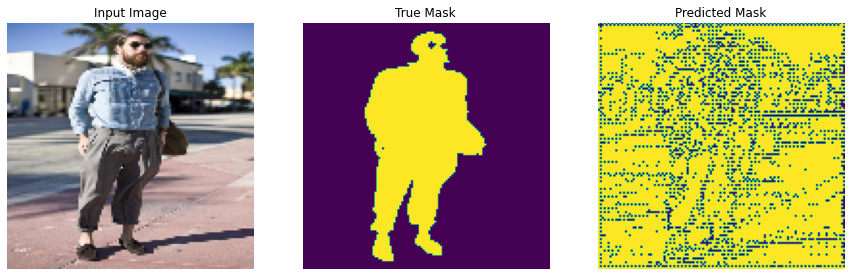

In [16]:
show_predictions(model)

Epoch 1/10
1/1 [==============================] - 0s 78ms/step- loss: 0.1997 - accuracy: 0.90


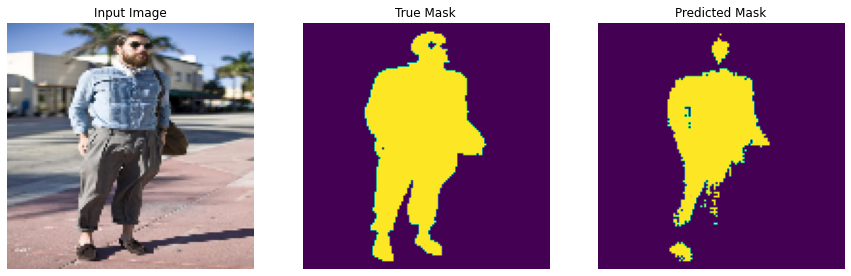


Sample Prediction after epoch 1

101/101 [==============================] - 600s 6s/step - loss: 0.1997 - accuracy: 0.9075 - val_loss: 0.4073 - val_accuracy: 0.8925
Epoch 2/10
1/1 [==============================] - 0s 74ms/step- loss: 0.0562 - accuracy: 0.97


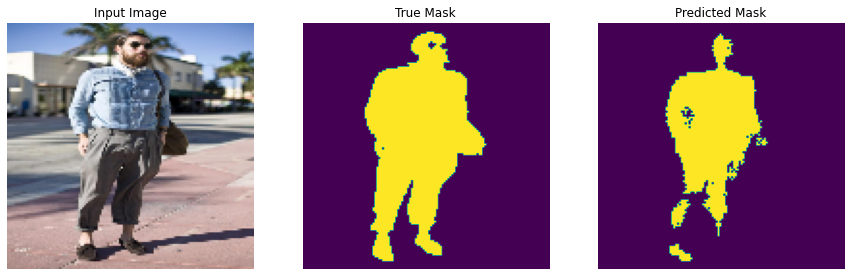


Sample Prediction after epoch 2

101/101 [==============================] - 604s 6s/step - loss: 0.0562 - accuracy: 0.9779 - val_loss: 0.3197 - val_accuracy: 0.9152
Epoch 3/10
1/1 [==============================] - 0s 47ms/step- loss: 0.0422 - accuracy: 0.98


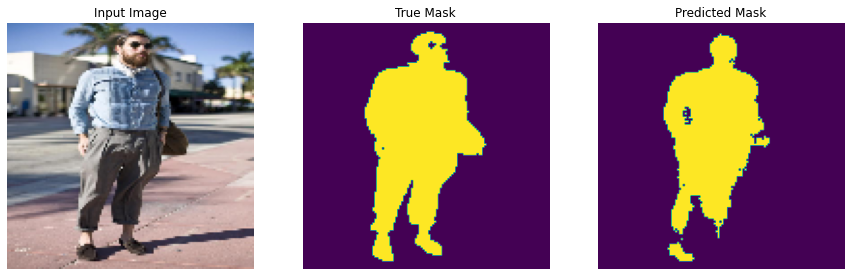


Sample Prediction after epoch 3

101/101 [==============================] - 517s 5s/step - loss: 0.0422 - accuracy: 0.9833 - val_loss: 0.1994 - val_accuracy: 0.9457
Epoch 4/10
1/1 [==============================] - 0s 47ms/step- loss: 0.0347 - accuracy: 0.98


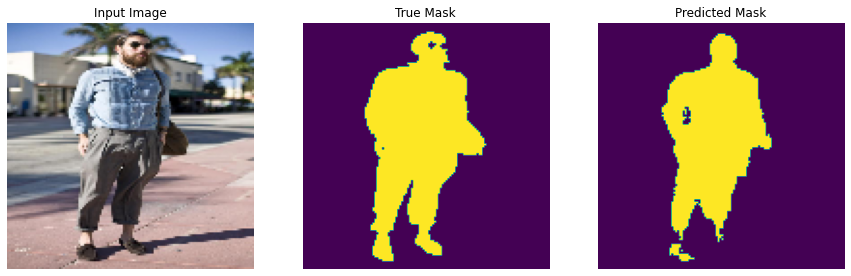


Sample Prediction after epoch 4

101/101 [==============================] - 498s 5s/step - loss: 0.0347 - accuracy: 0.9862 - val_loss: 0.1929 - val_accuracy: 0.9508
Epoch 5/10
1/1 [==============================] - 0s 46ms/step- loss: 0.0301 - accuracy: 0.98


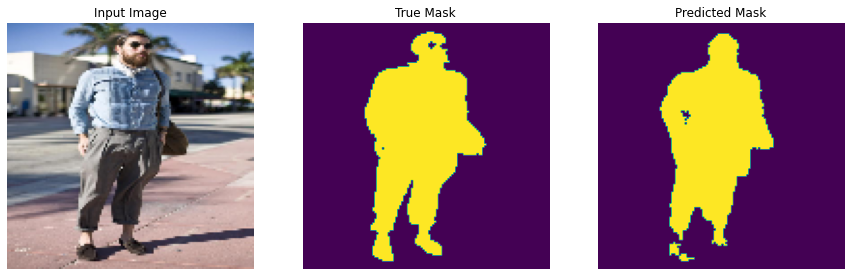


Sample Prediction after epoch 5

101/101 [==============================] - 454s 4s/step - loss: 0.0301 - accuracy: 0.9880 - val_loss: 0.1578 - val_accuracy: 0.9591
Epoch 6/10
1/1 [==============================] - 0s 39ms/step- loss: 0.0268 - accuracy: 0.98


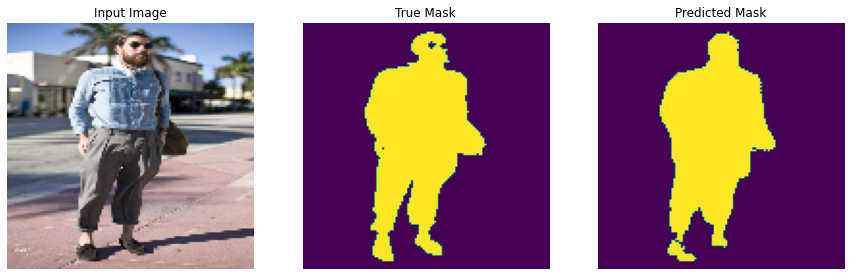


Sample Prediction after epoch 6

101/101 [==============================] - 414s 4s/step - loss: 0.0268 - accuracy: 0.9893 - val_loss: 0.1331 - val_accuracy: 0.9654
Epoch 7/10
1/1 [==============================] - 0s 39ms/step- loss: 0.0242 - accuracy: 0.99


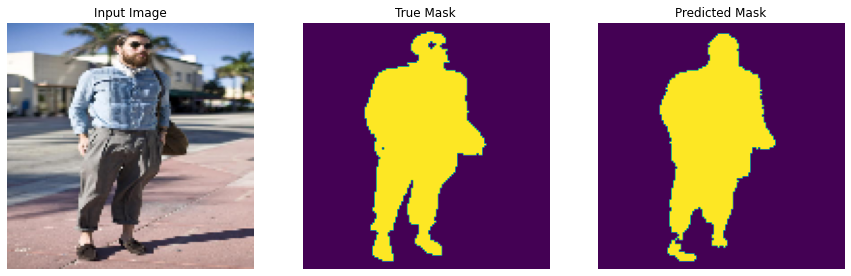


Sample Prediction after epoch 7

101/101 [==============================] - 351s 3s/step - loss: 0.0242 - accuracy: 0.9903 - val_loss: 0.1442 - val_accuracy: 0.9648
Epoch 8/10
1/1 [==============================] - 0s 44ms/step- loss: 0.0221 - accuracy: 0.99


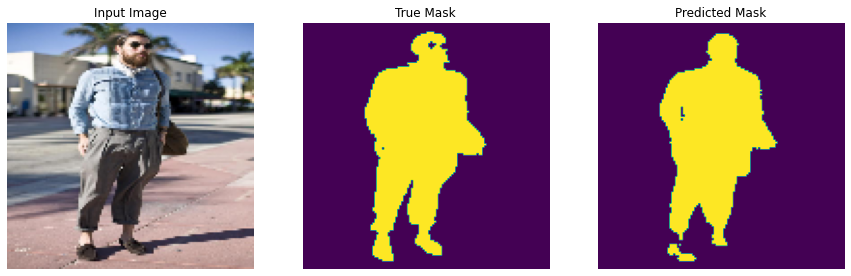


Sample Prediction after epoch 8

101/101 [==============================] - 351s 3s/step - loss: 0.0221 - accuracy: 0.9911 - val_loss: 0.1518 - val_accuracy: 0.9640
Epoch 9/10
1/1 [==============================] - 0s 38ms/step- loss: 0.0205 - accuracy: 0.99


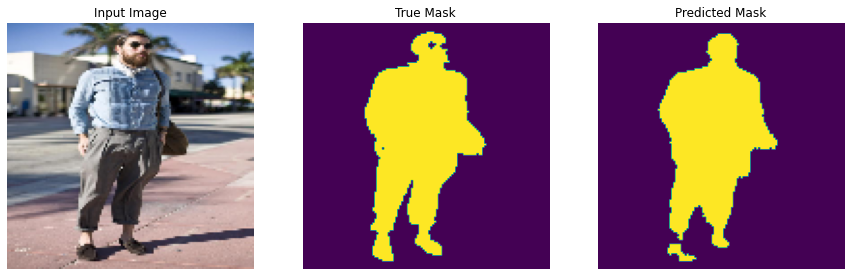


Sample Prediction after epoch 9

101/101 [==============================] - 350s 3s/step - loss: 0.0205 - accuracy: 0.9918 - val_loss: 0.1491 - val_accuracy: 0.9658
Epoch 10/10
1/1 [==============================] - 0s 37ms/step- loss: 0.0190 - accuracy: 0.99


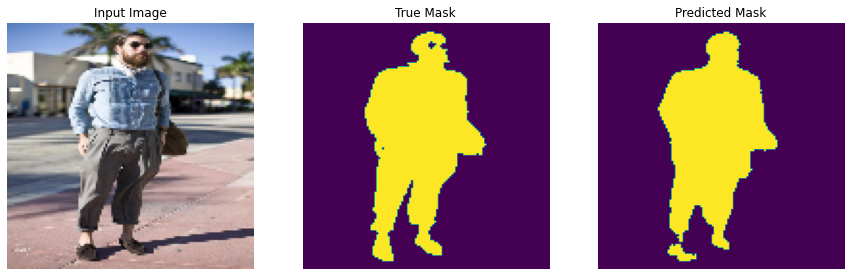


Sample Prediction after epoch 10

101/101 [==============================] - 351s 3s/step - loss: 0.0190 - accuracy: 0.9923 - val_loss: 0.1361 - val_accuracy: 0.9683


In [17]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    show_predictions(model)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))


EPOCHS = 10 # увеличьте при необходимости

model_history = model.fit(train, epochs=EPOCHS,
                          batch_size=BATCH_SIZE,
                          validation_data=test,
                          callbacks=[DisplayCallback()])
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

In [16]:
BATCH_SIZE = 32
BUFFER_SIZE = 500

In [11]:
tf.random.set_seed(12)
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

# down_stack.trainable = False

up_stack = [
    tf.keras.layers.Conv2DTranspose(512, 3, strides=2, padding='same', 
                                    use_bias=False, activation='relu'),
    tf.keras.layers.Conv2DTranspose(256, 3, strides=2, padding='same', 
                                    use_bias=False, activation='relu'),
    tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same', 
                                    use_bias=False, activation='relu'),
    tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same', 
                                    use_bias=False, activation='relu')
]

In [12]:
def resolution_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(output_channels, 69, strides=2, 
                                         padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [13]:
OUTPUT_CHANNELS = 69

model = resolution_model(OUTPUT_CHANNELS)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [17]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    show_predictions(model)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

EPOCHS = 50 # увеличьте при необходимости

model_history = model.fit(train, epochs=EPOCHS,
                          batch_size=BATCH_SIZE,
                          validation_data=test,
                          callbacks=[DisplayCallback()])
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

Epoch 1/50


2022-08-14 08:25:22.952192: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 5382291456 exceeds 10% of free system memory.


  6/402 [..............................] - ETA: 16:03:47 - loss: 51.0256 - accuracy: 0.5189

KeyboardInterrupt: 

Epoch 1/10


/home/mrb/.local/lib/python3.10/site-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


1/1 [==============================] - 0s 232ms/step loss: 1.2936 - accuracy: 0.70


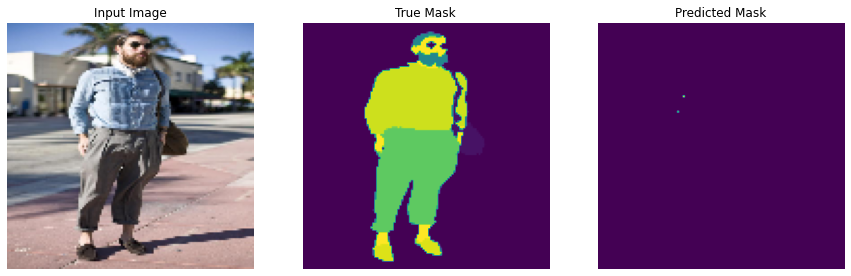


Sample Prediction after epoch 1

201/201 [==============================] - 883s 4s/step - loss: 1.2936 - accuracy: 0.7097 - val_loss: 0.9706 - val_accuracy: 0.7657
Epoch 2/10
1/1 [==============================] - 0s 207ms/step loss: 0.8619 - accuracy: 0.77


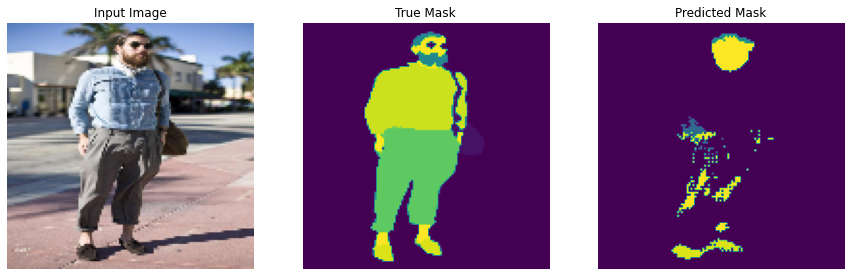


Sample Prediction after epoch 2

201/201 [==============================] - 725s 4s/step - loss: 0.8619 - accuracy: 0.7796 - val_loss: 0.8336 - val_accuracy: 0.7885
Epoch 3/10
1/1 [==============================] - 0s 42ms/step- loss: 0.7498 - accuracy: 0.80


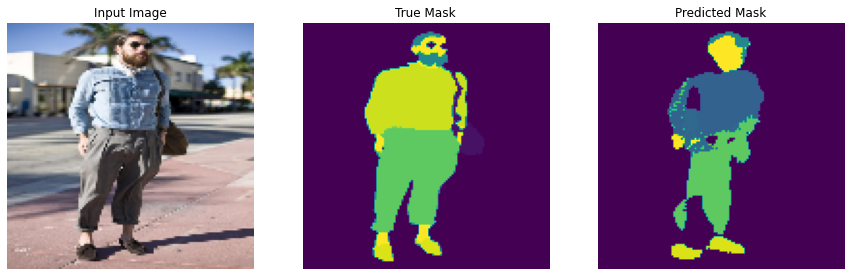


Sample Prediction after epoch 3

201/201 [==============================] - 538s 3s/step - loss: 0.7498 - accuracy: 0.8097 - val_loss: 0.7213 - val_accuracy: 0.8171
Epoch 4/10
1/1 [==============================] - 0s 30ms/step- loss: 0.6667 - accuracy: 0.82


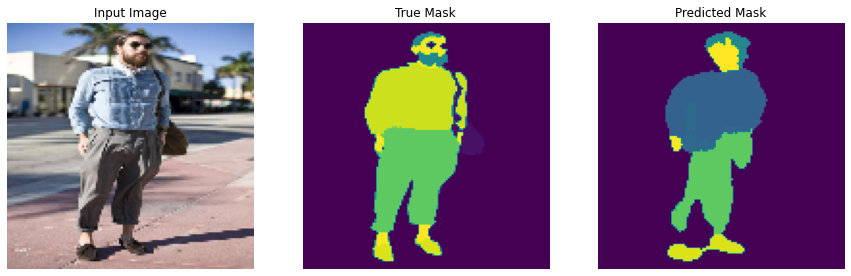


Sample Prediction after epoch 4

201/201 [==============================] - 534s 3s/step - loss: 0.6667 - accuracy: 0.8283 - val_loss: 0.6491 - val_accuracy: 0.8316
Epoch 5/10
1/1 [==============================] - 0s 28ms/step- loss: 0.6072 - accuracy: 0.84


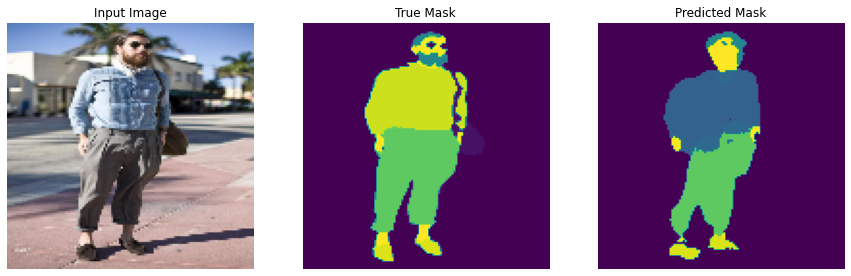


Sample Prediction after epoch 5

201/201 [==============================] - 524s 3s/step - loss: 0.6072 - accuracy: 0.8409 - val_loss: 0.6165 - val_accuracy: 0.8372
Epoch 6/10
1/1 [==============================] - 0s 29ms/step- loss: 0.5667 - accuracy: 0.84


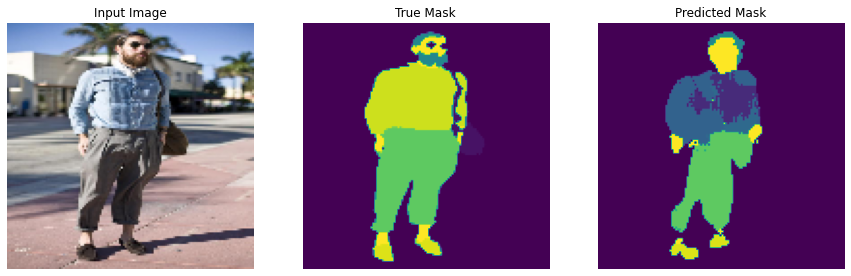


Sample Prediction after epoch 6

201/201 [==============================] - 502s 2s/step - loss: 0.5667 - accuracy: 0.8499 - val_loss: 0.5991 - val_accuracy: 0.8428
Epoch 7/10
1/1 [==============================] - 0s 200ms/step loss: 0.5245 - accuracy: 0.85


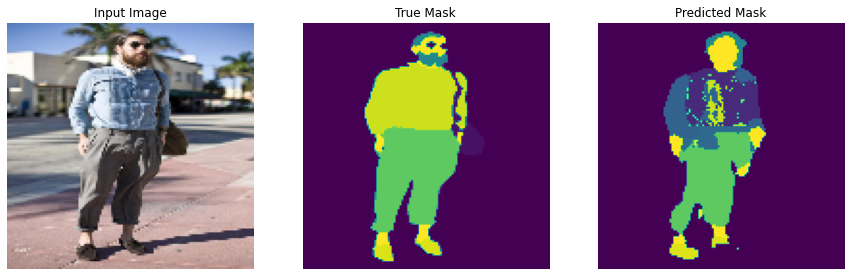


Sample Prediction after epoch 7

201/201 [==============================] - 793s 4s/step - loss: 0.5245 - accuracy: 0.8596 - val_loss: 0.5934 - val_accuracy: 0.8453
Epoch 8/10
1/1 [==============================] - 0s 85ms/step- loss: 0.4897 - accuracy: 0.86


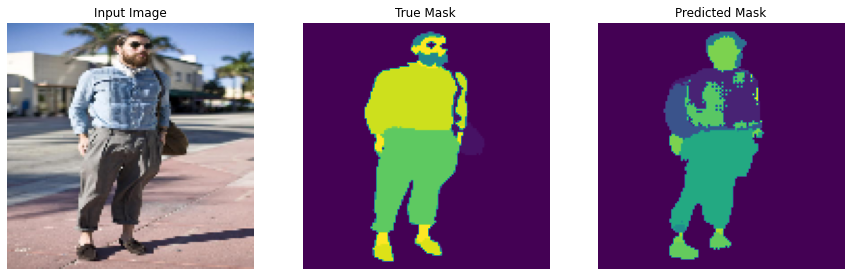


Sample Prediction after epoch 8

201/201 [==============================] - 732s 4s/step - loss: 0.4897 - accuracy: 0.8674 - val_loss: 0.5792 - val_accuracy: 0.8507
Epoch 9/10
1/1 [==============================] - 0s 87ms/step- loss: 0.4602 - accuracy: 0.87


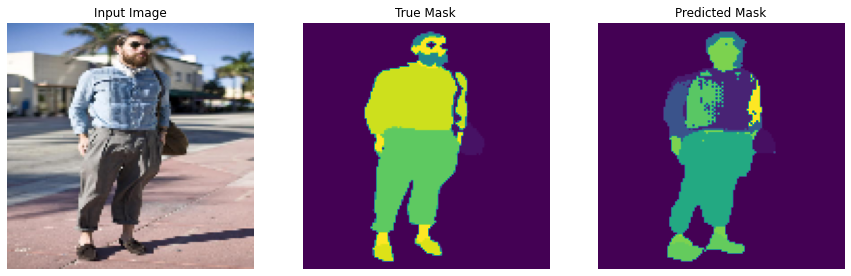


Sample Prediction after epoch 9

201/201 [==============================] - 601s 3s/step - loss: 0.4602 - accuracy: 0.8742 - val_loss: 0.5904 - val_accuracy: 0.8506
Epoch 10/10
1/1 [==============================] - 0s 86ms/step- loss: 0.4319 - accuracy: 0.88


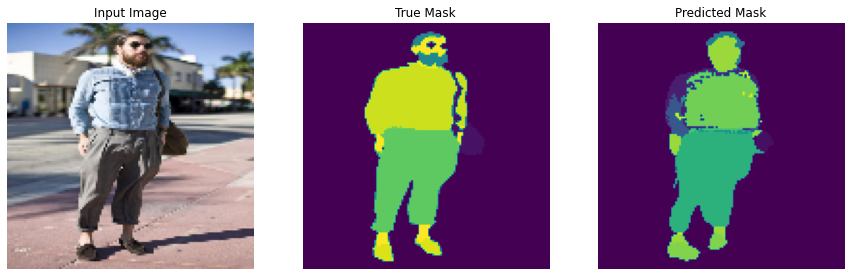


Sample Prediction after epoch 10

201/201 [==============================] - 623s 3s/step - loss: 0.4319 - accuracy: 0.8823 - val_loss: 0.5902 - val_accuracy: 0.8499


In [23]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

def build_model():
    tf.keras.backend.clear_session()
    inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

    #Contraction path
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = tf.keras.layers.Dropout(0.1)(c1)
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = tf.keras.layers.Dropout(0.1)(c2)
    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = tf.keras.layers.Dropout(0.2)(c3)
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = tf.keras.layers.Dropout(0.2)(c4)
    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = tf.keras.layers.Dropout(0.3)(c5)
    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    #Expansive path 
    u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = tf.keras.layers.Dropout(0.2)(c6)
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = tf.keras.layers.Dropout(0.2)(c7)
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = tf.keras.layers.Dropout(0.1)(c8)
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = tf.keras.layers.Dropout(0.1)(c9)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = tf.keras.layers.Conv2D(69, (1, 1), activation='sigmoid')(c9)

    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
    return model

model = build_model()
model_history = model.fit(train, epochs=EPOCHS,
                          batch_size=BATCH_SIZE,
                          validation_data=test,
                          callbacks=[DisplayCallback()])
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

Epoch 1/50
1/1 [==============================] - 0s 370ms/step loss: 1.5762 - accuracy: 0.66


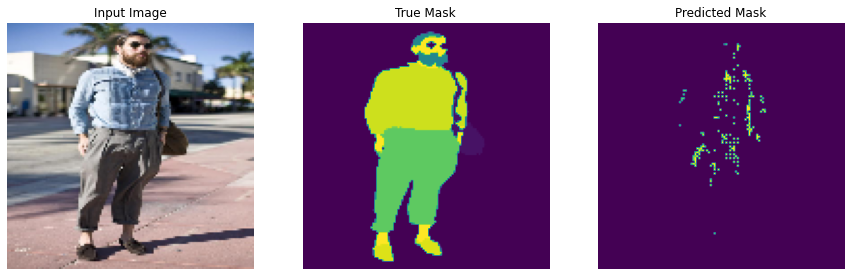


Sample Prediction after epoch 1

201/201 [==============================] - 637s 3s/step - loss: 1.5762 - accuracy: 0.6638 - val_loss: 1.0117 - val_accuracy: 0.7656
Epoch 2/50
1/1 [==============================] - 0s 257ms/step loss: 0.8784 - accuracy: 0.77


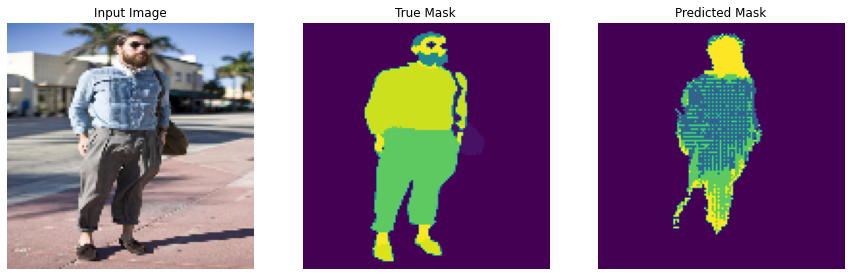


Sample Prediction after epoch 2

201/201 [==============================] - 535s 3s/step - loss: 0.8784 - accuracy: 0.7761 - val_loss: 0.8285 - val_accuracy: 0.7907
Epoch 3/50
1/1 [==============================] - 0s 98ms/step- loss: 0.7797 - accuracy: 0.80


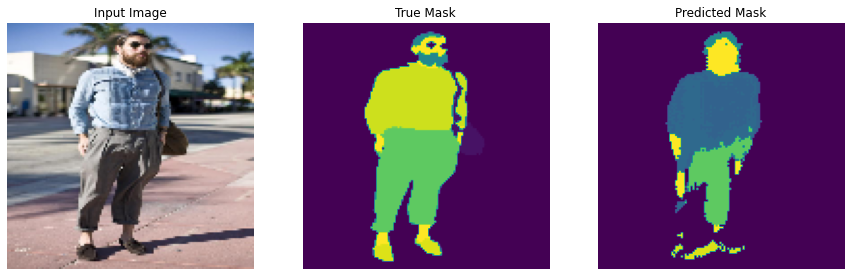


Sample Prediction after epoch 3

201/201 [==============================] - 602s 3s/step - loss: 0.7797 - accuracy: 0.8005 - val_loss: 0.7430 - val_accuracy: 0.8121
Epoch 4/50
1/1 [==============================] - 0s 74ms/step- loss: 0.6981 - accuracy: 0.81


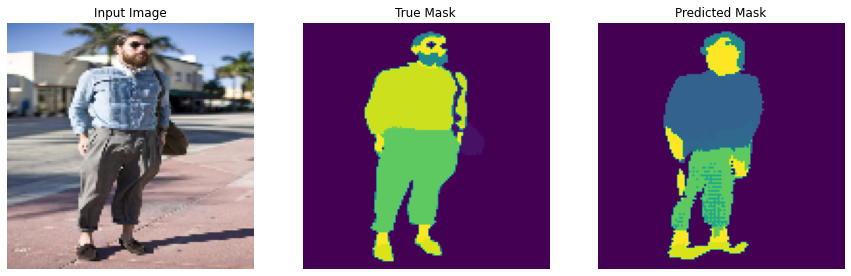


Sample Prediction after epoch 4

201/201 [==============================] - 647s 3s/step - loss: 0.6981 - accuracy: 0.8194 - val_loss: 0.6716 - val_accuracy: 0.8268
Epoch 5/50
1/1 [==============================] - 0s 45ms/step- loss: 0.6255 - accuracy: 0.83


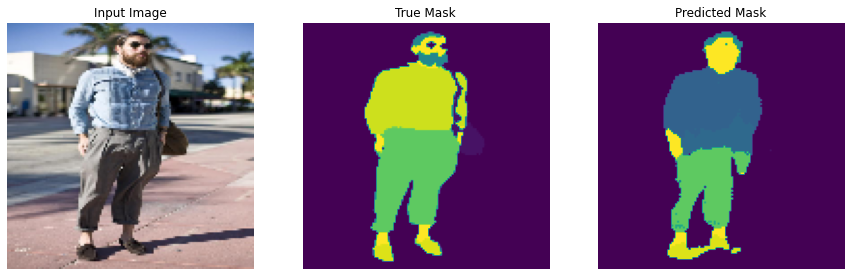


Sample Prediction after epoch 5

201/201 [==============================] - 677s 3s/step - loss: 0.6255 - accuracy: 0.8322 - val_loss: 0.6222 - val_accuracy: 0.8336
Epoch 6/50
1/1 [==============================] - 0s 255ms/step loss: 0.5821 - accuracy: 0.84


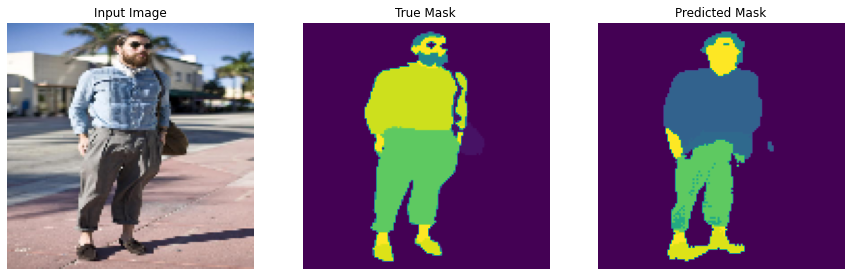


Sample Prediction after epoch 6

201/201 [==============================] - 761s 4s/step - loss: 0.5821 - accuracy: 0.8420 - val_loss: 0.5952 - val_accuracy: 0.8401
Epoch 7/50
1/1 [==============================] - 0s 87ms/step- loss: 0.5435 - accuracy: 0.85


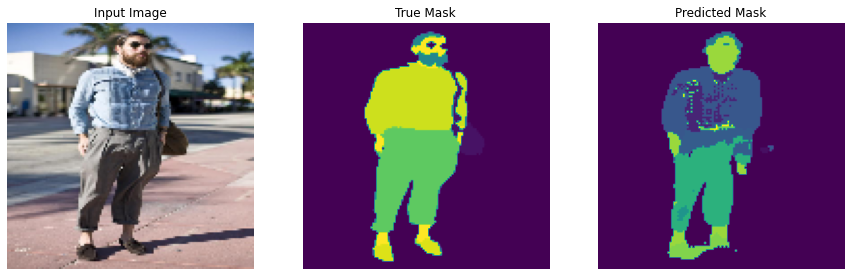


Sample Prediction after epoch 7

201/201 [==============================] - 757s 4s/step - loss: 0.5435 - accuracy: 0.8519 - val_loss: 0.5963 - val_accuracy: 0.8409
Epoch 8/50
1/1 [==============================] - 0s 63ms/step- loss: 0.5123 - accuracy: 0.86


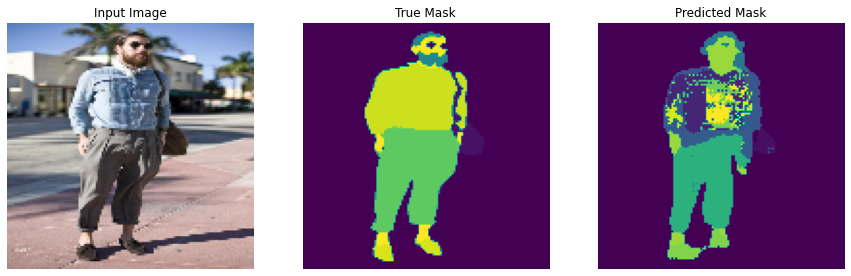


Sample Prediction after epoch 8

201/201 [==============================] - 1393s 7s/step - loss: 0.5123 - accuracy: 0.8605 - val_loss: 0.5911 - val_accuracy: 0.8459
Epoch 9/50
1/1 [==============================] - 0s 197ms/step loss: 0.4824 - accuracy: 0.86


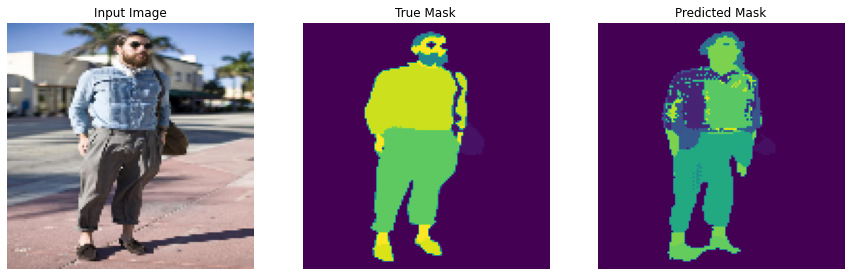


Sample Prediction after epoch 9

201/201 [==============================] - 729s 4s/step - loss: 0.4824 - accuracy: 0.8685 - val_loss: 0.5815 - val_accuracy: 0.8474
Epoch 10/50
1/1 [==============================] - 0s 216ms/step loss: 0.4530 - accuracy: 0.87


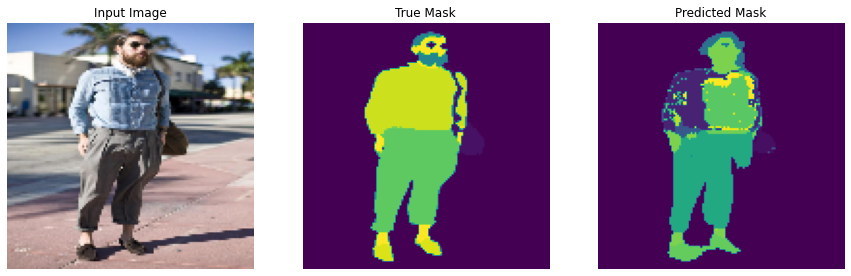


Sample Prediction after epoch 10

201/201 [==============================] - 707s 3s/step - loss: 0.4530 - accuracy: 0.8769 - val_loss: 0.6029 - val_accuracy: 0.8486
Epoch 11/50
1/1 [==============================] - 0s 32ms/step- loss: 0.4299 - accuracy: 0.88


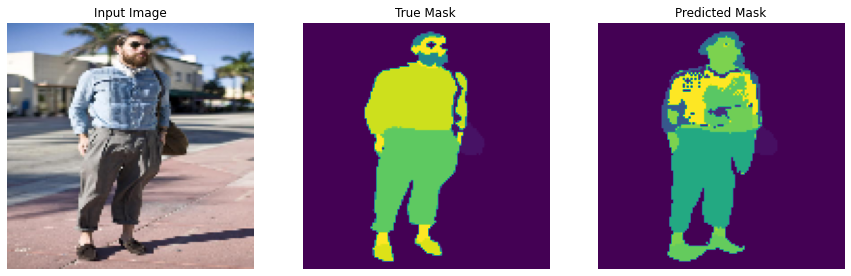


Sample Prediction after epoch 11

201/201 [==============================] - 543s 3s/step - loss: 0.4299 - accuracy: 0.8838 - val_loss: 0.6265 - val_accuracy: 0.8489
Epoch 12/50
1/1 [==============================] - 0s 32ms/step- loss: 0.4054 - accuracy: 0.89


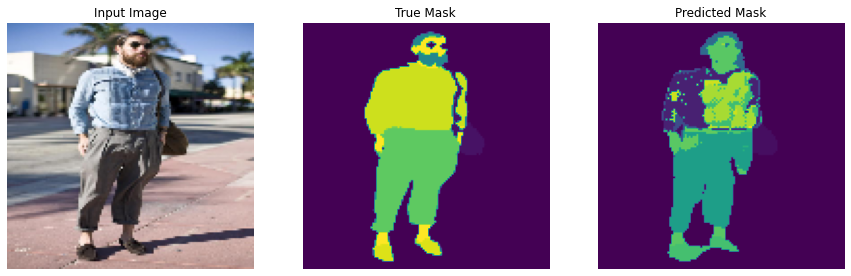


Sample Prediction after epoch 12

201/201 [==============================] - 531s 3s/step - loss: 0.4054 - accuracy: 0.8905 - val_loss: 0.6156 - val_accuracy: 0.8494
Epoch 13/50
1/1 [==============================] - 0s 31ms/step- loss: 0.3847 - accuracy: 0.89


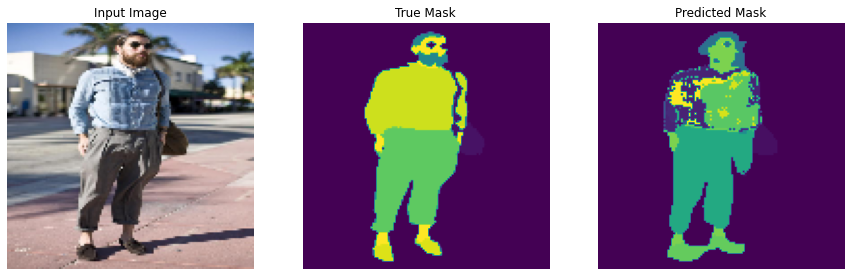


Sample Prediction after epoch 13

201/201 [==============================] - 531s 3s/step - loss: 0.3847 - accuracy: 0.8968 - val_loss: 0.6170 - val_accuracy: 0.8507
Epoch 14/50
1/1 [==============================] - 0s 93ms/step- loss: 0.3627 - accuracy: 0.90


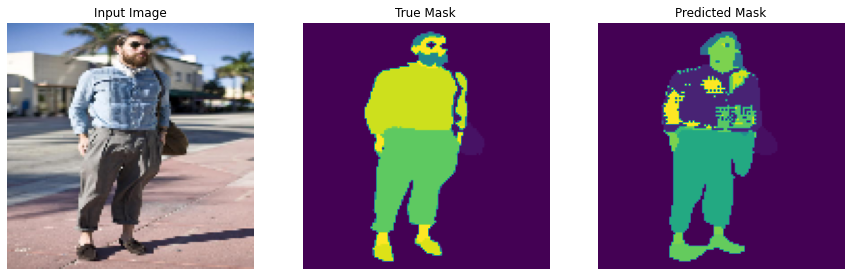


Sample Prediction after epoch 14

201/201 [==============================] - 528s 3s/step - loss: 0.3627 - accuracy: 0.9032 - val_loss: 0.6356 - val_accuracy: 0.8527
Epoch 15/50
1/1 [==============================] - 0s 33ms/step- loss: 0.3442 - accuracy: 0.90


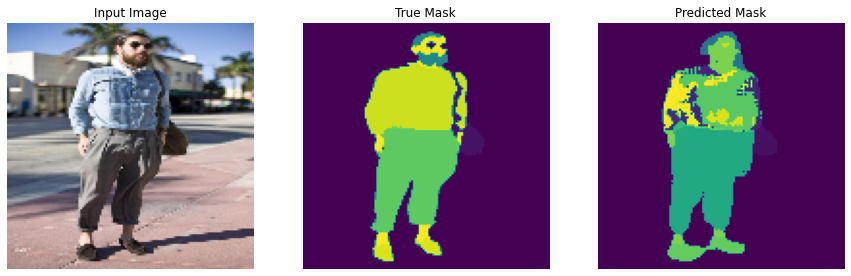


Sample Prediction after epoch 15

201/201 [==============================] - 527s 3s/step - loss: 0.3442 - accuracy: 0.9089 - val_loss: 0.6707 - val_accuracy: 0.8514
Epoch 16/50
1/1 [==============================] - 0s 34ms/step- loss: 0.3307 - accuracy: 0.91


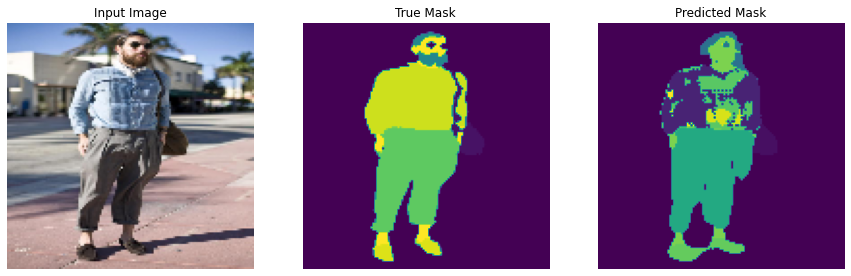


Sample Prediction after epoch 16

201/201 [==============================] - 530s 3s/step - loss: 0.3307 - accuracy: 0.9130 - val_loss: 0.6722 - val_accuracy: 0.8546
Epoch 17/50
1/1 [==============================] - 0s 30ms/step- loss: 0.3151 - accuracy: 0.91


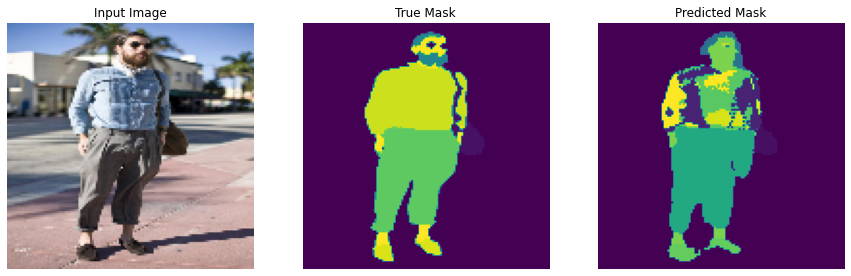


Sample Prediction after epoch 17

201/201 [==============================] - 529s 3s/step - loss: 0.3151 - accuracy: 0.9177 - val_loss: 0.6577 - val_accuracy: 0.8549
Epoch 18/50
1/1 [==============================] - 0s 28ms/step- loss: 0.2991 - accuracy: 0.92


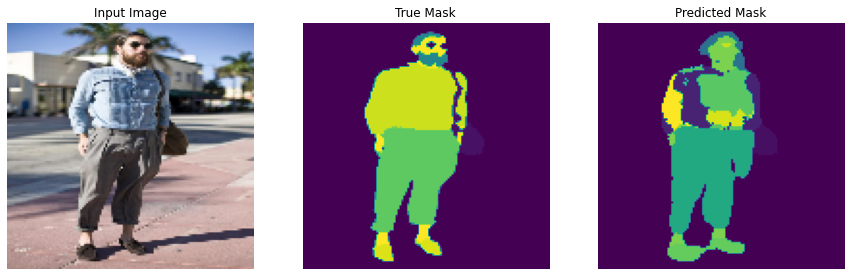


Sample Prediction after epoch 18

201/201 [==============================] - 529s 3s/step - loss: 0.2991 - accuracy: 0.9225 - val_loss: 0.6865 - val_accuracy: 0.8517
Epoch 19/50
1/1 [==============================] - 0s 76ms/step- loss: 0.2887 - accuracy: 0.92


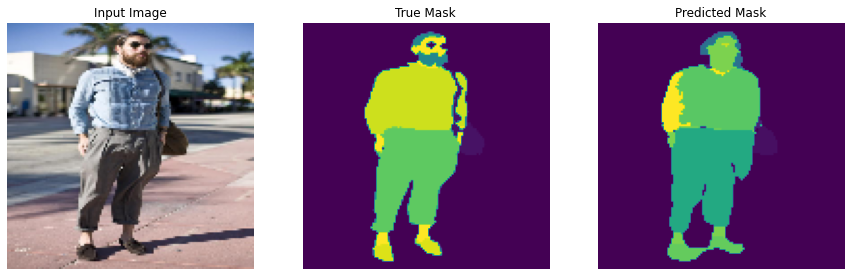


Sample Prediction after epoch 19

201/201 [==============================] - 528s 3s/step - loss: 0.2887 - accuracy: 0.9257 - val_loss: 0.7238 - val_accuracy: 0.8551
Epoch 20/50
1/1 [==============================] - 0s 31ms/step- loss: 0.2769 - accuracy: 0.92


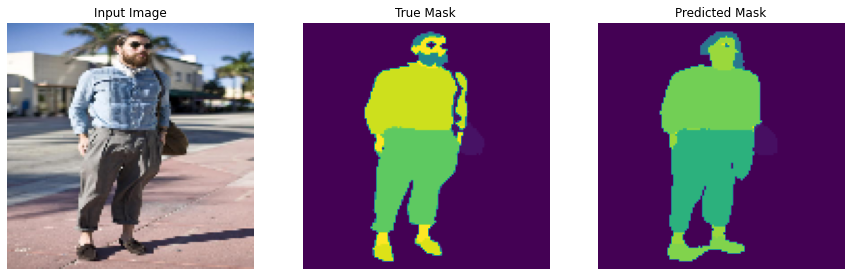


Sample Prediction after epoch 20

201/201 [==============================] - 527s 3s/step - loss: 0.2769 - accuracy: 0.9291 - val_loss: 0.7310 - val_accuracy: 0.8528
Epoch 21/50
1/1 [==============================] - 0s 36ms/step- loss: 0.2658 - accuracy: 0.93


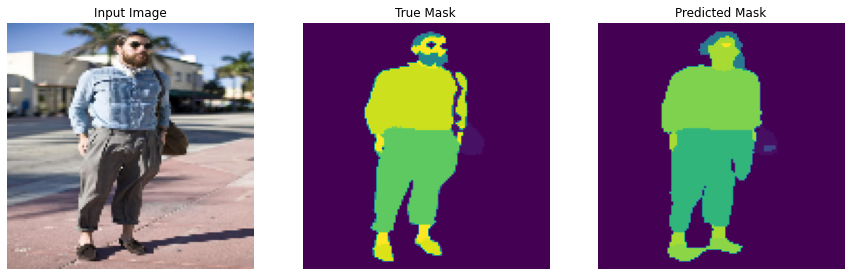


Sample Prediction after epoch 21

201/201 [==============================] - 528s 3s/step - loss: 0.2658 - accuracy: 0.9324 - val_loss: 0.7221 - val_accuracy: 0.8541
Epoch 22/50
1/1 [==============================] - 0s 33ms/step- loss: 0.2572 - accuracy: 0.93


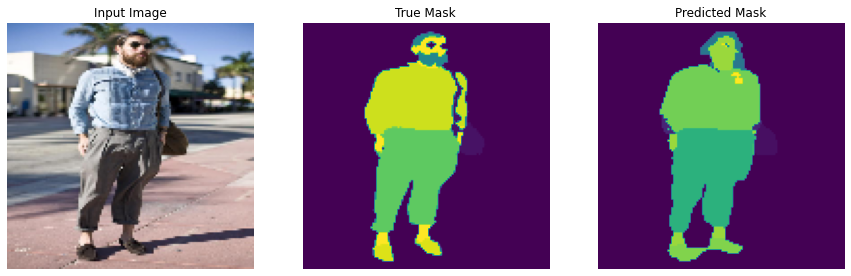


Sample Prediction after epoch 22

201/201 [==============================] - 528s 3s/step - loss: 0.2572 - accuracy: 0.9352 - val_loss: 0.7852 - val_accuracy: 0.8527
Epoch 23/50
1/1 [==============================] - 0s 28ms/step- loss: 0.2516 - accuracy: 0.93


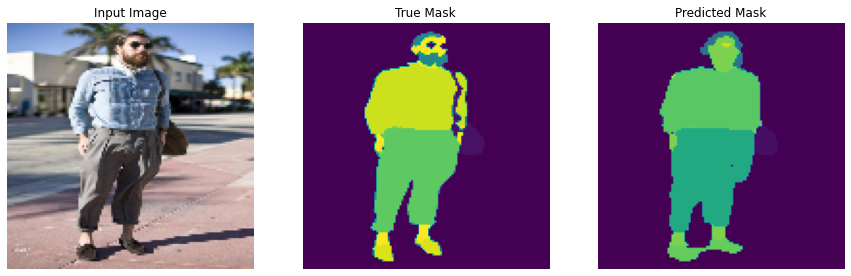


Sample Prediction after epoch 23

201/201 [==============================] - 529s 3s/step - loss: 0.2516 - accuracy: 0.9369 - val_loss: 0.7572 - val_accuracy: 0.8530
Epoch 24/50
1/1 [==============================] - 0s 46ms/step- loss: 0.2464 - accuracy: 0.93


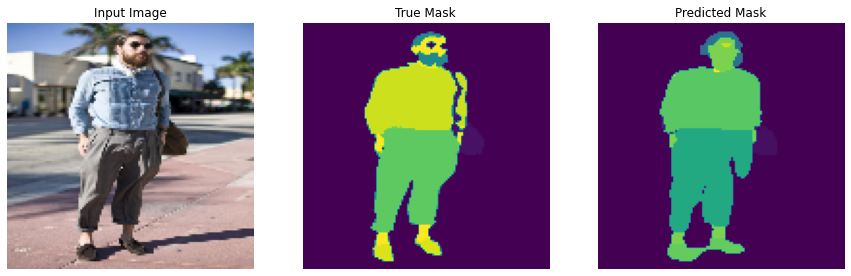


Sample Prediction after epoch 24

201/201 [==============================] - 528s 3s/step - loss: 0.2464 - accuracy: 0.9385 - val_loss: 0.7846 - val_accuracy: 0.8542
Epoch 25/50
1/1 [==============================] - 0s 31ms/step- loss: 0.2356 - accuracy: 0.94


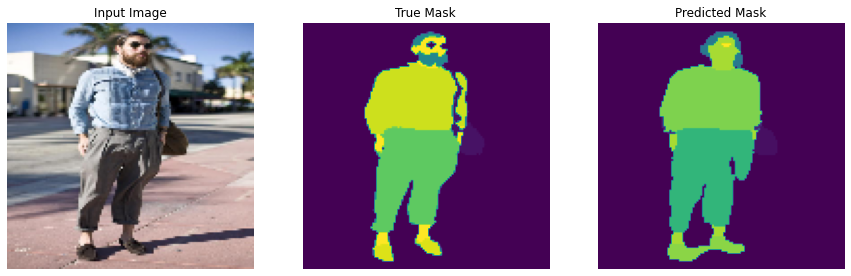


Sample Prediction after epoch 25

201/201 [==============================] - 532s 3s/step - loss: 0.2356 - accuracy: 0.9419 - val_loss: 0.8076 - val_accuracy: 0.8561
Epoch 26/50
1/1 [==============================] - 0s 209ms/step loss: 0.2291 - accuracy: 0.94


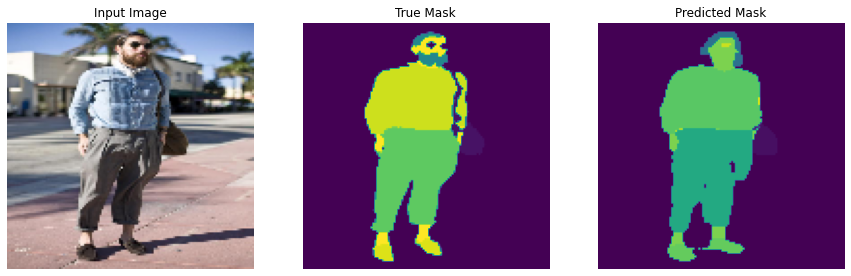


Sample Prediction after epoch 26

201/201 [==============================] - 530s 3s/step - loss: 0.2291 - accuracy: 0.9439 - val_loss: 0.8421 - val_accuracy: 0.8528
Epoch 27/50
1/1 [==============================] - 0s 31ms/step- loss: 0.2194 - accuracy: 0.94


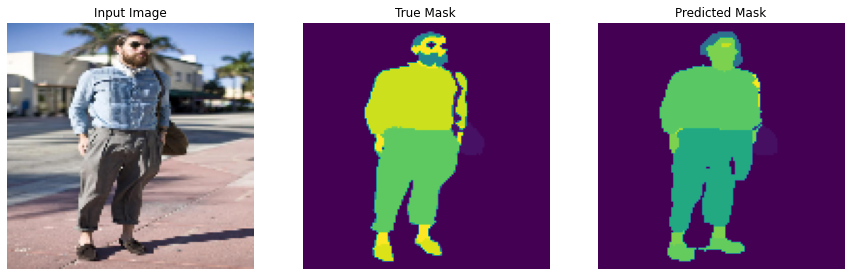


Sample Prediction after epoch 27

201/201 [==============================] - 529s 3s/step - loss: 0.2194 - accuracy: 0.9467 - val_loss: 0.8266 - val_accuracy: 0.8547
Epoch 28/50
1/1 [==============================] - 0s 30ms/step- loss: 0.2158 - accuracy: 0.94


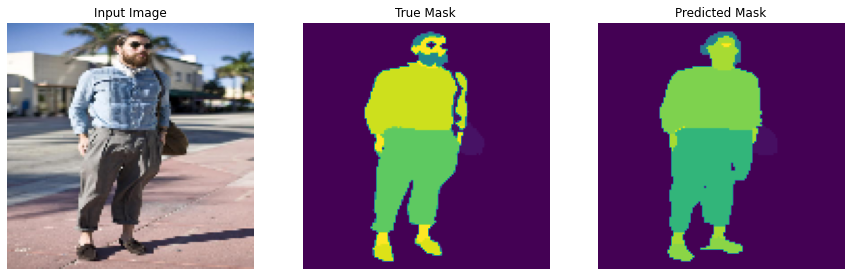


Sample Prediction after epoch 28

201/201 [==============================] - 527s 3s/step - loss: 0.2158 - accuracy: 0.9478 - val_loss: 0.8593 - val_accuracy: 0.8568
Epoch 29/50
1/1 [==============================] - 0s 29ms/step- loss: 0.2100 - accuracy: 0.94


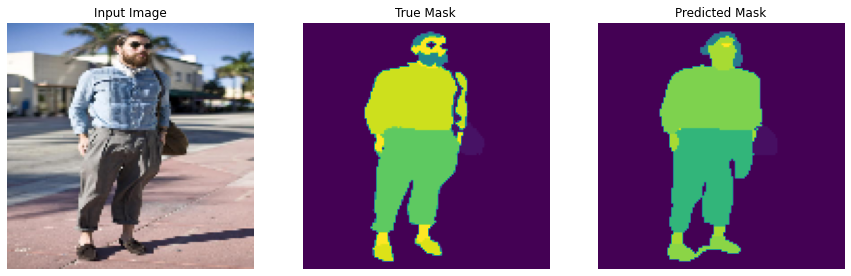


Sample Prediction after epoch 29

201/201 [==============================] - 529s 3s/step - loss: 0.2100 - accuracy: 0.9496 - val_loss: 0.8896 - val_accuracy: 0.8536
Epoch 30/50
1/1 [==============================] - 0s 29ms/step- loss: 0.2086 - accuracy: 0.95


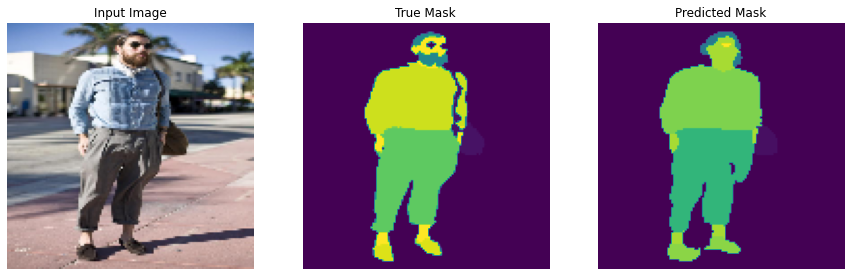


Sample Prediction after epoch 30

201/201 [==============================] - 528s 3s/step - loss: 0.2086 - accuracy: 0.9500 - val_loss: 0.8370 - val_accuracy: 0.8545
Epoch 31/50
1/1 [==============================] - 0s 32ms/step- loss: 0.2045 - accuracy: 0.95


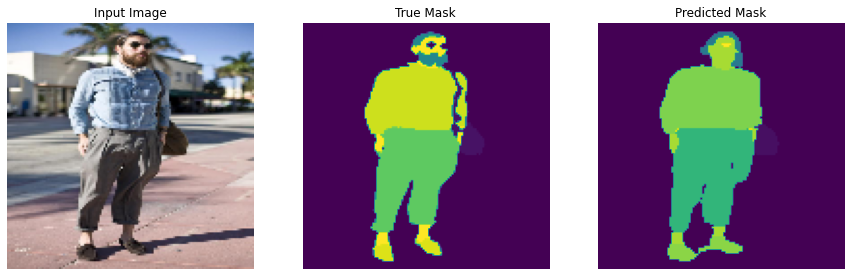


Sample Prediction after epoch 31

201/201 [==============================] - 530s 3s/step - loss: 0.2045 - accuracy: 0.9511 - val_loss: 0.8647 - val_accuracy: 0.8553
Epoch 32/50
1/1 [==============================] - 0s 36ms/step- loss: 0.2002 - accuracy: 0.95


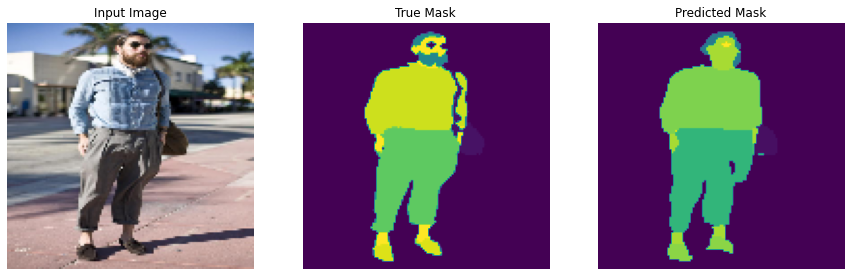


Sample Prediction after epoch 32

201/201 [==============================] - 528s 3s/step - loss: 0.2002 - accuracy: 0.9523 - val_loss: 0.8680 - val_accuracy: 0.8582
Epoch 33/50
1/1 [==============================] - 0s 29ms/step- loss: 0.1928 - accuracy: 0.95


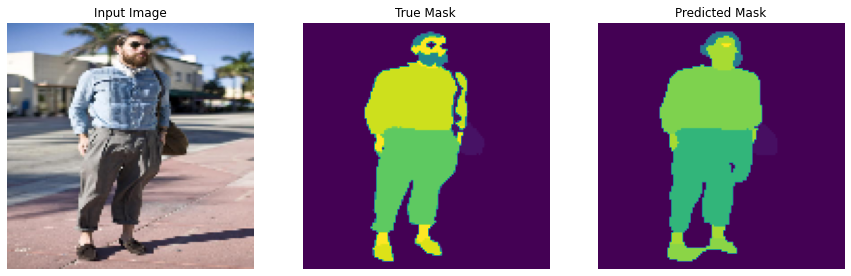


Sample Prediction after epoch 33

201/201 [==============================] - 513s 3s/step - loss: 0.1928 - accuracy: 0.9543 - val_loss: 0.9050 - val_accuracy: 0.8582
Epoch 34/50
1/1 [==============================] - 0s 34ms/step- loss: 0.1936 - accuracy: 0.95


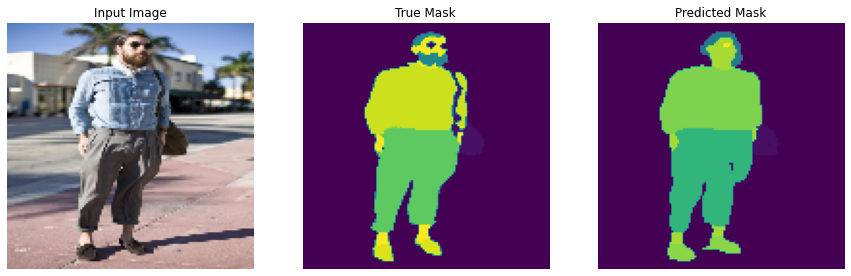


Sample Prediction after epoch 34

201/201 [==============================] - 506s 3s/step - loss: 0.1936 - accuracy: 0.9541 - val_loss: 0.8956 - val_accuracy: 0.8586
Epoch 35/50
1/1 [==============================] - 0s 28ms/step- loss: 0.1935 - accuracy: 0.95


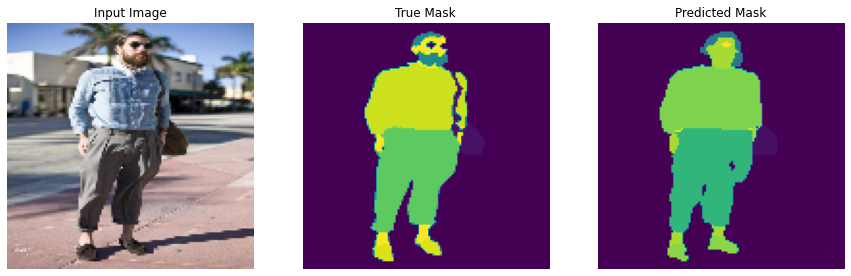


Sample Prediction after epoch 35

201/201 [==============================] - 508s 3s/step - loss: 0.1935 - accuracy: 0.9541 - val_loss: 0.8916 - val_accuracy: 0.8573
Epoch 36/50
1/1 [==============================] - 0s 27ms/step- loss: 0.1895 - accuracy: 0.95


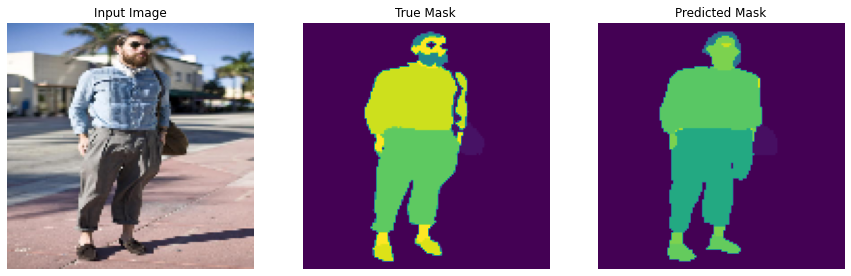


Sample Prediction after epoch 36

201/201 [==============================] - 508s 3s/step - loss: 0.1895 - accuracy: 0.9552 - val_loss: 0.9071 - val_accuracy: 0.8580
Epoch 37/50
1/1 [==============================] - 0s 32ms/step- loss: 0.1824 - accuracy: 0.95


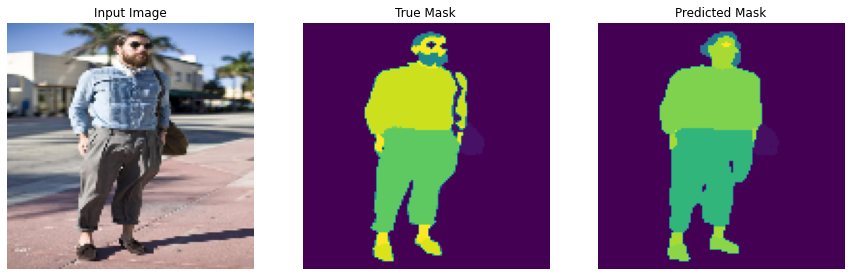


Sample Prediction after epoch 37

201/201 [==============================] - 510s 3s/step - loss: 0.1824 - accuracy: 0.9570 - val_loss: 0.9210 - val_accuracy: 0.8581
Epoch 38/50
1/1 [==============================] - 0s 29ms/step- loss: 0.1808 - accuracy: 0.95


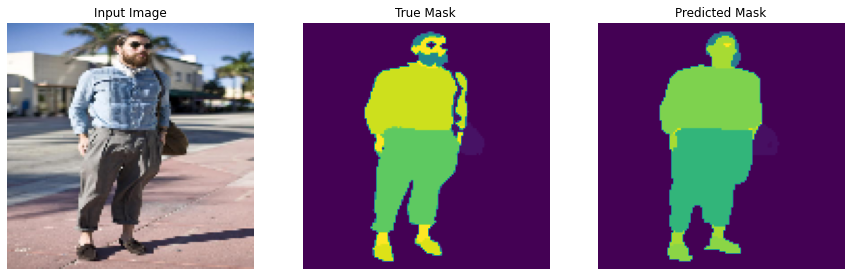


Sample Prediction after epoch 38

201/201 [==============================] - 507s 3s/step - loss: 0.1808 - accuracy: 0.9575 - val_loss: 0.9188 - val_accuracy: 0.8554
Epoch 39/50
1/1 [==============================] - 0s 30ms/step- loss: 0.1785 - accuracy: 0.95


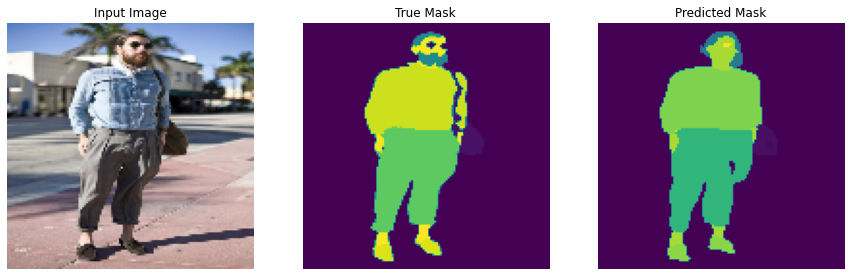


Sample Prediction after epoch 39

201/201 [==============================] - 510s 3s/step - loss: 0.1785 - accuracy: 0.9580 - val_loss: 0.9202 - val_accuracy: 0.8613
Epoch 40/50
1/1 [==============================] - 0s 31ms/step- loss: 0.1744 - accuracy: 0.95


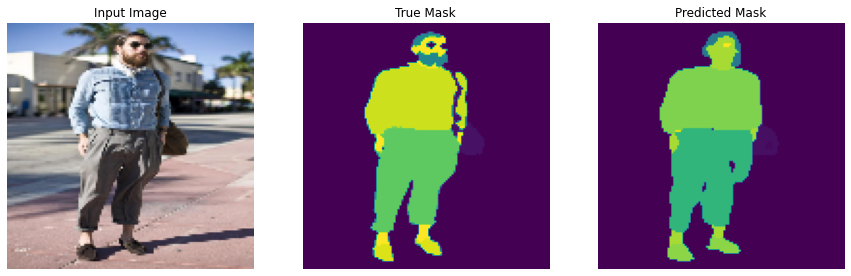


Sample Prediction after epoch 40

201/201 [==============================] - 507s 3s/step - loss: 0.1744 - accuracy: 0.9591 - val_loss: 0.9189 - val_accuracy: 0.8600
Epoch 41/50
1/1 [==============================] - 0s 29ms/step- loss: 0.1702 - accuracy: 0.96


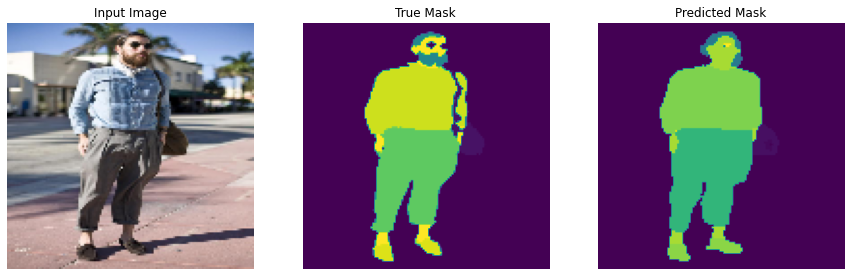


Sample Prediction after epoch 41

201/201 [==============================] - 508s 3s/step - loss: 0.1702 - accuracy: 0.9602 - val_loss: 0.9532 - val_accuracy: 0.8581
Epoch 42/50
1/1 [==============================] - 0s 31ms/step- loss: 0.1696 - accuracy: 0.96


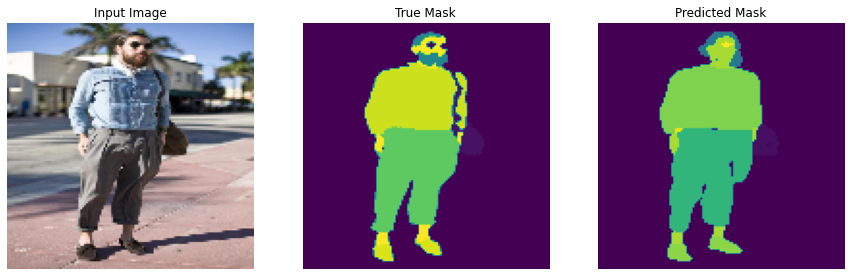


Sample Prediction after epoch 42

201/201 [==============================] - 508s 3s/step - loss: 0.1696 - accuracy: 0.9603 - val_loss: 0.9298 - val_accuracy: 0.8586
Epoch 43/50
1/1 [==============================] - 0s 28ms/step- loss: 0.1681 - accuracy: 0.96


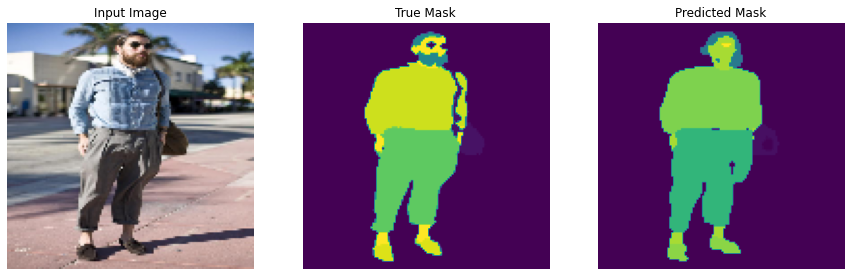


Sample Prediction after epoch 43

201/201 [==============================] - 507s 3s/step - loss: 0.1681 - accuracy: 0.9606 - val_loss: 0.9569 - val_accuracy: 0.8572
Epoch 44/50
1/1 [==============================] - 0s 30ms/step- loss: 0.1699 - accuracy: 0.96


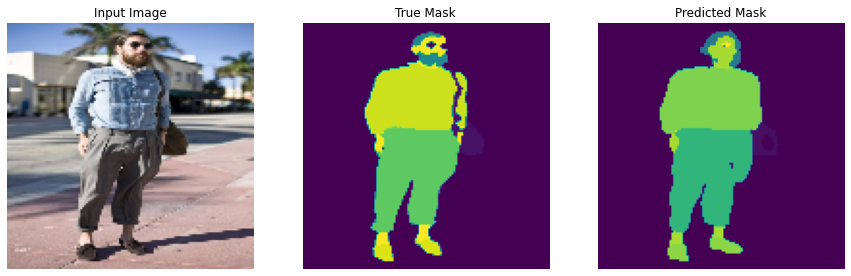


Sample Prediction after epoch 44

201/201 [==============================] - 508s 3s/step - loss: 0.1699 - accuracy: 0.9601 - val_loss: 0.9703 - val_accuracy: 0.8602
Epoch 45/50
1/1 [==============================] - 0s 32ms/step- loss: 0.1672 - accuracy: 0.96


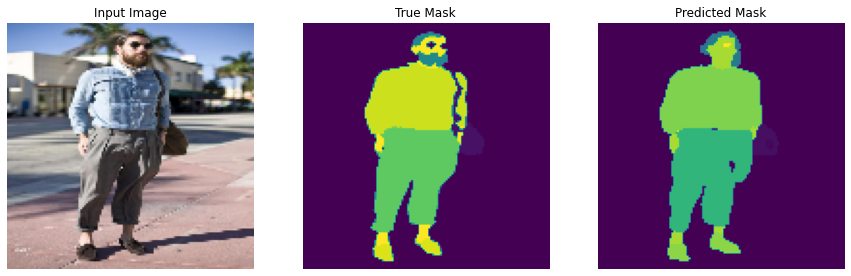


Sample Prediction after epoch 45

201/201 [==============================] - 508s 3s/step - loss: 0.1672 - accuracy: 0.9609 - val_loss: 0.9580 - val_accuracy: 0.8595
Epoch 46/50
1/1 [==============================] - 0s 30ms/step- loss: 0.1626 - accuracy: 0.96


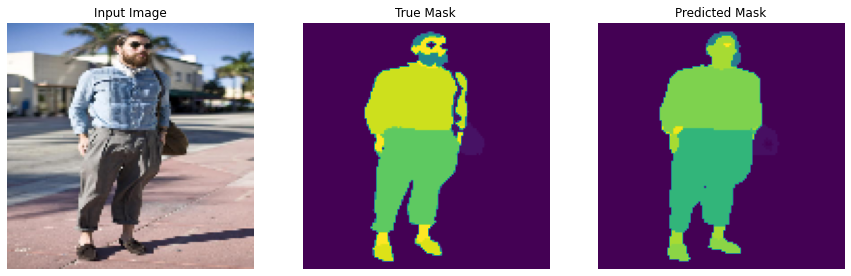


Sample Prediction after epoch 46

201/201 [==============================] - 508s 3s/step - loss: 0.1626 - accuracy: 0.9620 - val_loss: 0.9755 - val_accuracy: 0.8582
Epoch 47/50
1/1 [==============================] - 0s 27ms/step- loss: 0.1647 - accuracy: 0.96


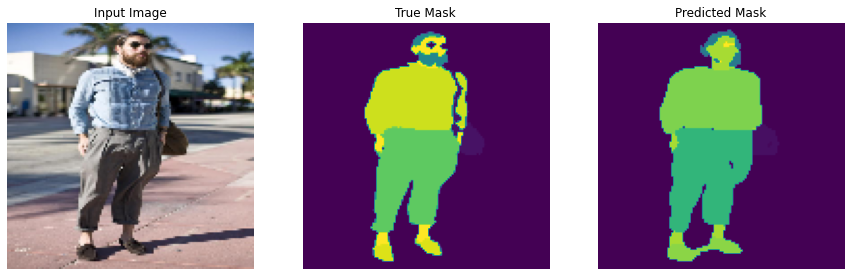


Sample Prediction after epoch 47

201/201 [==============================] - 507s 3s/step - loss: 0.1647 - accuracy: 0.9614 - val_loss: 0.9418 - val_accuracy: 0.8568
Epoch 48/50
1/1 [==============================] - 0s 26ms/step- loss: 0.1592 - accuracy: 0.96


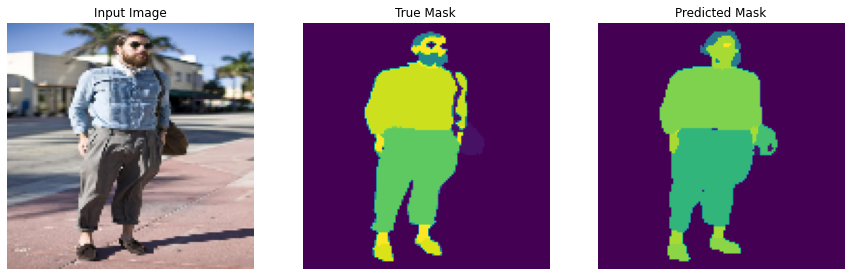


Sample Prediction after epoch 48

201/201 [==============================] - 508s 3s/step - loss: 0.1592 - accuracy: 0.9629 - val_loss: 0.9852 - val_accuracy: 0.8600
Epoch 49/50
1/1 [==============================] - 0s 29ms/step- loss: 0.1571 - accuracy: 0.96


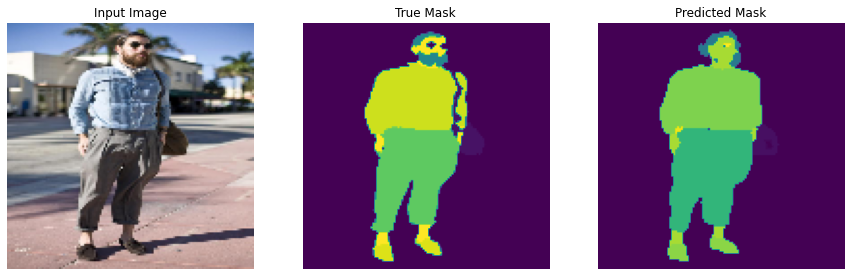


Sample Prediction after epoch 49

201/201 [==============================] - 508s 3s/step - loss: 0.1571 - accuracy: 0.9634 - val_loss: 0.9757 - val_accuracy: 0.8619
Epoch 50/50
1/1 [==============================] - 0s 29ms/step- loss: 0.1626 - accuracy: 0.96


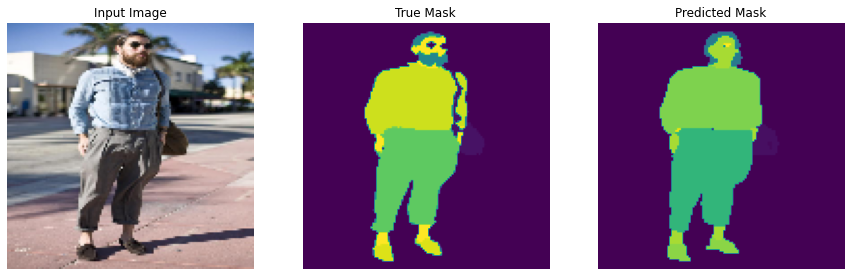


Sample Prediction after epoch 50

201/201 [==============================] - 507s 3s/step - loss: 0.1626 - accuracy: 0.9619 - val_loss: 0.9414 - val_accuracy: 0.8628


In [24]:
IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3

def build_model():
    tf.keras.backend.clear_session()
    inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

    #Contraction path
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = tf.keras.layers.Dropout(0.1)(c1)
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = tf.keras.layers.Dropout(0.1)(c2)
    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = tf.keras.layers.Dropout(0.2)(c3)
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = tf.keras.layers.Dropout(0.2)(c4)
    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = tf.keras.layers.Dropout(0.3)(c5)
    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    #Expansive path 
    u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = tf.keras.layers.Dropout(0.2)(c6)
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = tf.keras.layers.Dropout(0.2)(c7)
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = tf.keras.layers.Dropout(0.1)(c8)
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = tf.keras.layers.Dropout(0.1)(c9)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = tf.keras.layers.Conv2D(69, (1, 1), activation='sigmoid')(c9)

    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
    return model

model = build_model()
model_history = model.fit(train, epochs=50,
                          batch_size=16,
                          validation_data=test,
                          callbacks=[DisplayCallback()])
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']